## ML bird species identification using my own custom photos - fast.ai solution 

Most of this notebook follows the outline provided in the fastai MOOCs. 
If you want to see the complete notebook, and run it against the full Caltech-UCSD data set
look at my Kaggle notebook (https://www.kaggle.com/mesadowski/caltech-ucsd-bird-image-dataset-fastai).  However, this notebook has been altered slighly to just run against the specific dataset I've created using actual pictures from my birdfeeder. The rationale for doing this was that I found that using a canned data set didn't provide good predictions. Using a stripped down version of the Caltech-UCSD data set I got around 95% validation accuracy, but I was getting nowhere near that accuracy in inference using pictures from my bird feeder. So my feeling was that training with pictures from my bird feeder would provide much better predictions. That seems to be the case. 

If you want to try this, I suggest running it in Google Colab. You get some free GPU hours, and you don't need to pay to fire up your own server. To run this (using Google Colab) you need to put folders with the appropriate bird photos in your Google Drive (in a folder called /content/drive/MyDrive/Bird_Images), and connect it to Colab. The first cell of the notebook will ask you to link your Google Drive with Colab and enter an authorization code, so do that. 

Turn on the GPU before running this. This is going to be way too slow if you try to run it on a CPU.  

In [2]:
!pip install fastai

In [3]:
# install the fastai libraries and import them.  At this point Google Colab will ask you to 
# enter an authorization code to connect to your Google Drive
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 7.7MB/s 
     |████████████████████████████████| 204kB 15.0MB/s 
     |████████████████████████████████| 51kB 7.7MB/s 
     |████████████████████████████████| 1.2MB 16.1MB/s 
     |████████████████████████████████| 61kB 9.3MB/s 
     |████████████████████████████████| 51kB 8.5MB/s 
Mounted at /content/gdrive


In [4]:
#mount google drive to store the notebook, output, etc.
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
from fastbook import *
from fastai.vision.all import *
from fastai.callback.fp16 import *

In [7]:
# get the image dataset. All of the images should be in folders in this location
# with the folder names equal to the bird species
path = Path('/content/drive/MyDrive/Bird_Images')
path

Path('/content/drive/MyDrive/Bird_Images')

In [8]:
#The data set includes several text files and folders.  We mainly care about the images folder
path.ls()

(#15) [Path('/content/drive/MyDrive/Bird_Images/Sparrow'),Path('/content/drive/MyDrive/Bird_Images/Black-eyed Junco'),Path('/content/drive/MyDrive/Bird_Images/Blackbird'),Path('/content/drive/MyDrive/Bird_Images/Goldfinch'),Path('/content/drive/MyDrive/Bird_Images/Cardinal'),Path('/content/drive/MyDrive/Bird_Images/Northern Flicker'),Path('/content/drive/MyDrive/Bird_Images/Wren'),Path('/content/drive/MyDrive/Bird_Images/Black-capped Chickadee'),Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker'),Path('/content/drive/MyDrive/Bird_Images/Nuthatch')...]

In [9]:
# For example, here's one of the folders
fname = (path).ls()[10]
fname

Path('/content/drive/MyDrive/Bird_Images/Blue Jay')

In [10]:
#Within the folders we have a bunch of photos
(path/'Red-bellied Woodpecker').ls()

(#280) [Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker/mo-2478.jpg'),Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker/mo-2774.jpg'),Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker/mo-2930.jpg'),Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker/mo-1152.jpg'),Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker/mo-1395.jpg'),Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker/mo-1907.jpg'),Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker/mo-2048.jpg'),Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker/mo-2049.jpg'),Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker/mo-1624.jpg'),Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker/mo-1936.jpg')...]

In [11]:
# Come back to this later(?). Maybe use a regex to clean up the labels to remove the learning digits
#re.sub(r'^[\d.-]+\s*', '', fname.name)

In [12]:
# Create a data loader for our data set. This is a key step.  If you use "from_folder", fastai knows to create labels from the name of each folder
# i.e., our bird species.  I'm letting fastai determine the test and validation sets, rather than use the recommended ones 
# provided by the dataset. 
#dls = ImageDataLoaders.from_folder(path, valid_pct=0.20,seed=12345, \
#                                   item_tfms=Resize(224), batch_tfms=aug_transforms(size=224, min_scale=0.75), \
#                                   bs=64,shuffle_train=True)
dls = ImageDataLoaders.from_folder(path, valid_pct=0.20,seed=12345, \
                                   item_tfms=Resize(224), \
                                   bs=64,shuffle_train=True)

In [13]:
# Here's an example of the training images
dls.train_ds.items[:10]

[Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker/mo-2774.jpg'),
 Path('/content/drive/MyDrive/Bird_Images/Titmouse/mo-5689.jpg'),
 Path('/content/drive/MyDrive/Bird_Images/Downy Woodpecker/D00237.jpg'),
 Path('/content/drive/MyDrive/Bird_Images/Black-eyed Junco/mo-3590.jpg'),
 Path('/content/drive/MyDrive/Bird_Images/Goldfinch/mo-1913.jpg'),
 Path('/content/drive/MyDrive/Bird_Images/Downy Woodpecker/D00217.jpg'),
 Path('/content/drive/MyDrive/Bird_Images/Black-eyed Junco/mo-2094.jpg'),
 Path('/content/drive/MyDrive/Bird_Images/Sparrow/mo-1989 (1).jpg'),
 Path('/content/drive/MyDrive/Bird_Images/Red-bellied Woodpecker/mo-2215.jpg'),
 Path('/content/drive/MyDrive/Bird_Images/Downy Woodpecker/D00247.jpg')]

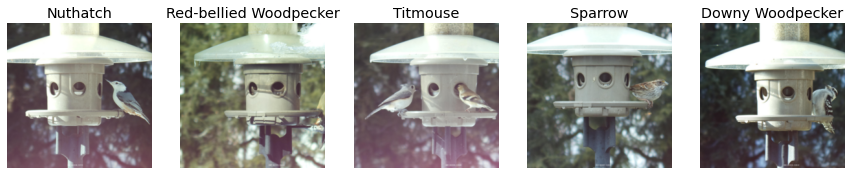

In [14]:
# check out some of the images in a batch. Because we're using image augmentation to crop and alter the images
# some of these may look a bit wierd
dls.show_batch(nrows=1, ncols=5)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


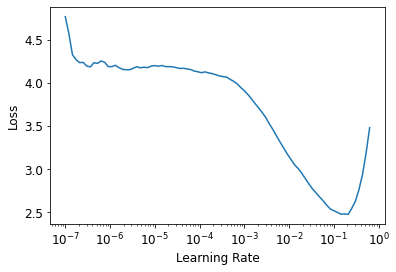

In [15]:
#fastai gives you a tool to find a good learning rate. This is really cool vs. guessing 
learn = cnn_learner(dls, resnet34, metrics=error_rate)
lr_min,lr_steep = learn.lr_find()

In [16]:
# They recommend using a learning rate one order of magnitude less than the LR that gives the minimum loss
print(f"Minimum/10: {lr_min:.2e}, steepest point: {lr_steep:.2e}")

Minimum/10: 2.09e-02, steepest point: 3.02e-03


In [17]:
# Let's do a short training run.  Whereas I used resnet50 when training my model with 
# all 200 species in the dataset, I found the resnet50 didn't provide better results. So I'm using resnet34 here
# Not bad, we're already at about 93% accuracy after just 2 epochs
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(2, base_lr=1.45e-02)

epoch,train_loss,valid_loss,error_rate,time
0,1.964851,0.646423,0.158392,03:14


epoch,train_loss,valid_loss,error_rate,time
0,0.709041,1.281134,0.200946,02:14
1,0.463921,0.262660,0.073286,02:14


In [18]:
# You can check out which bird species tend to get confused with other species of birds.
interp = ClassificationInterpretation.from_learner(learn)
interp.most_confused(min_val=1)

[('Titmouse', 'Nuthatch', 5),
 ('Black-eyed Junco', 'Titmouse', 3),
 ('Black-capped Chickadee', 'Goldfinch', 2),
 ('Blue Jay', 'Nuthatch', 2),
 ('House Finch', 'Sparrow', 2),
 ('Nuthatch', 'Black-capped Chickadee', 2),
 ('Nuthatch', 'Titmouse', 2),
 ('Titmouse', 'Black-eyed Junco', 2),
 ('Black-capped Chickadee', 'Downy Woodpecker', 1),
 ('Black-capped Chickadee', 'Titmouse', 1),
 ('Black-eyed Junco', 'Nuthatch', 1),
 ('Cardinal', 'House Finch', 1),
 ('Goldfinch', 'Sparrow', 1),
 ('Nuthatch', 'Downy Woodpecker', 1),
 ('Nuthatch', 'Goldfinch', 1),
 ('Sparrow', 'House Finch', 1),
 ('Sparrow', 'Pine Siskin', 1),
 ('Sparrow', 'Wren', 1),
 ('Titmouse', 'Black-capped Chickadee', 1)]

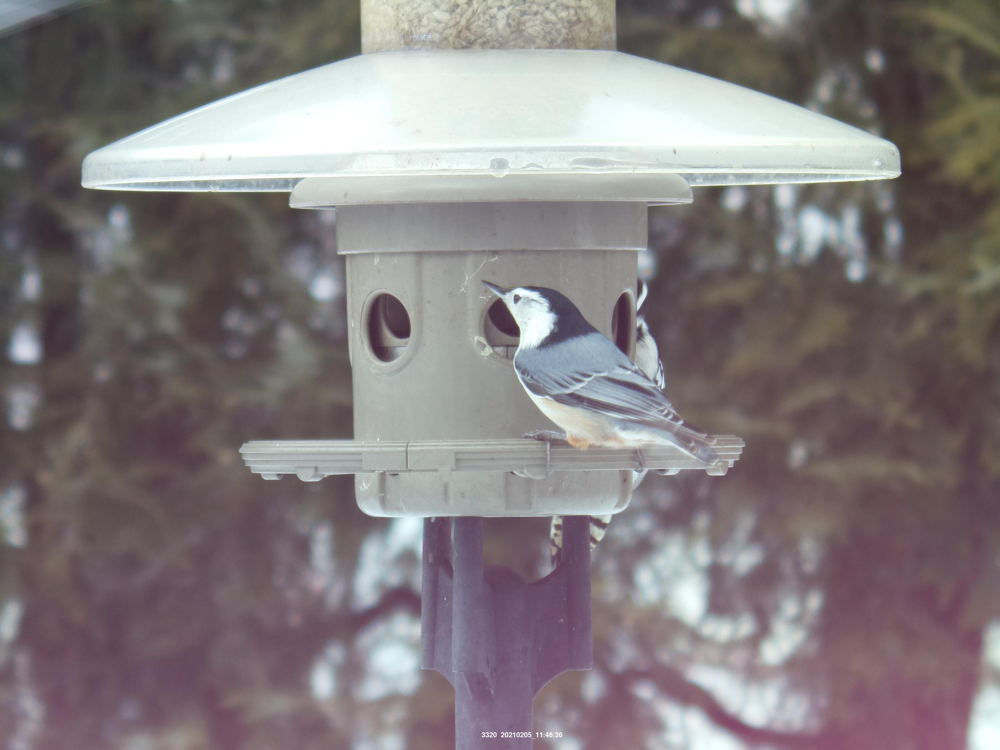

In [19]:
# Nuthatches sometimes get confused with Black-capped Chickadees. Heres a sample nuthatch. 
PILImage.create((path/"Nuthatch").ls()[12])

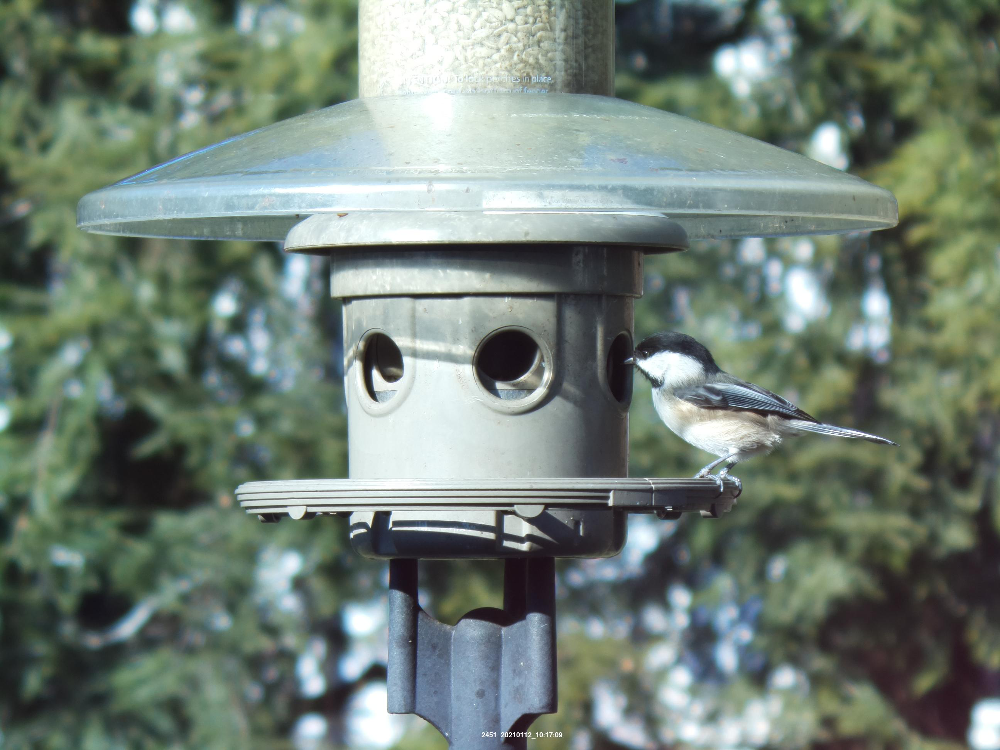

In [ ]:
# And here's a Black-capped Chickadee.  There is a dull blue color on both of their wings. 
# But all in all this is a great result--the model doesn't get confused very often. 
# It's going to be hard to do much better than this.
PILImage.create((path/"Black-capped Chickadee").ls()[1])

In [20]:
# fastai also let's you train using the fine_tune method. It automatically picks the learning rates.
# Let's see if it does better that what we did earlier with the fit_one_cycle method
# Try it for 3 epochs with resnet weights frozen, and then unfreeze for 6 epochs
# The error rate is a bit better than what we achieved above, although it took a lot longer to train.

learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(6, freeze_epochs=3)

epoch,train_loss,valid_loss,error_rate,time
0,3.612234,1.659384,0.484634,02:13
1,2.476867,0.821141,0.250591,02:13
2,1.735066,0.603308,0.177305,02:14


epoch,train_loss,valid_loss,error_rate,time
0,0.555364,0.380361,0.115839,02:14
1,0.378934,0.330082,0.082742,02:15
2,0.253946,0.269420,0.070922,02:21
3,0.170977,0.238693,0.061466,02:19
4,0.114301,0.224037,0.059102,02:20
5,0.080599,0.215873,0.056738,02:18


One nice thing is that because I gathered these images myself, from my bird feeder, the results will likely transfer over to inference. Previously I ued the Caltech/UCSD bird image data set. The originators of that data are quite clear that those images may have been used to train Resnet, so if you use a Resnet model with those images (which I do) you may get overly optmistic results that won't transfer over to inference with real images.

In [21]:
# Let's see how our "most confused" analysis looks now, with the better model.
# It's quite good. Nuthatches and Titmouses seem to get confused sometimes, as do
# Nuthatches and Chickadees. Beyond that, there's not a lot of confusion.
interp = ClassificationInterpretation.from_learner(learn)
interp.most_confused(min_val=1)

[('Blue Jay', 'Nuthatch', 2),
 ('Nuthatch', 'Titmouse', 2),
 ('Black-capped Chickadee', 'Goldfinch', 1),
 ('Black-capped Chickadee', 'Titmouse', 1),
 ('Black-eyed Junco', 'Black-capped Chickadee', 1),
 ('Black-eyed Junco', 'Nuthatch', 1),
 ('Blackbird', 'Black-capped Chickadee', 1),
 ('Downy Woodpecker', 'Nuthatch', 1),
 ('Downy Woodpecker', 'Red-bellied Woodpecker', 1),
 ('Goldfinch', 'Black-capped Chickadee', 1),
 ('House Finch', 'Sparrow', 1),
 ('House Finch', 'Titmouse', 1),
 ('House Finch', 'Wren', 1),
 ('Nuthatch', 'Black-capped Chickadee', 1),
 ('Nuthatch', 'Downy Woodpecker', 1),
 ('Nuthatch', 'Goldfinch', 1),
 ('Sparrow', 'Black-capped Chickadee', 1),
 ('Sparrow', 'Downy Woodpecker', 1),
 ('Sparrow', 'Goldfinch', 1),
 ('Titmouse', 'Black-capped Chickadee', 1),
 ('Titmouse', 'Black-eyed Junco', 1),
 ('Wren', 'Sparrow', 1)]

In [22]:
# pick a random image in the test set
image_path=dls.valid_ds.items[125]
image_path

Path('/content/drive/MyDrive/Bird_Images/Downy Woodpecker/D00109.jpg')

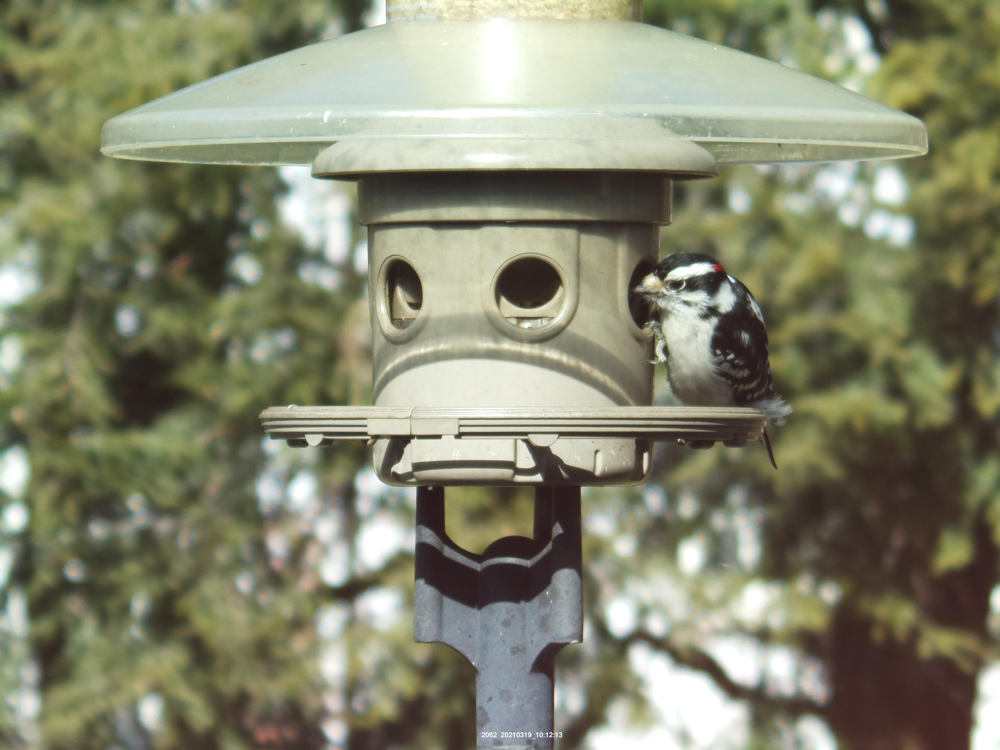

In [23]:
im=PILImage.create(image_path)
im

In [24]:
# try a prediction.  Nice!  It got it right
learn.predict(im)

('Downy Woodpecker',
 tensor(5),
 tensor([2.1901e-02, 2.0987e-03, 2.1366e-05, 1.6855e-04, 1.6193e-05, 9.7343e-01, 2.7130e-04, 2.0081e-05, 2.9419e-05, 1.1138e-03, 1.1585e-04, 1.6592e-05, 7.3727e-04, 2.1750e-05, 3.5208e-05]))

In [30]:
image_path = Path('/content/drive/MyDrive/Bird_Inference/')
image_path

Path('/content/drive/MyDrive/Bird_Inference')

In [31]:
images=os.listdir(image_path)
images

['crop-mo-2973.jpg',
 'mo-2464.jpg',
 'mo-3275.jpg',
 'mo-2623.jpg',
 'D00111.jpg',
 'mo-2025.jpg',
 'mo-1949.jpg',
 'mo-3652.jpg',
 'D00266.jpg',
 'mo-5635.jpg',
 'mo-7488.jpg',
 'mo-7567.jpg',
 'mo-7686.jpg',
 'mo-7875.jpg',
 'mo-8254.jpg']

('Red-bellied Woodpecker', tensor(11), tensor([9.9844e-06, 2.9427e-05, 3.3640e-04, 2.0750e-04, 1.2381e-03, 3.4220e-06, 2.2590e-05, 1.1634e-03, 3.1668e-05, 1.0354e-05, 9.5836e-05, 9.8507e-01, 2.7899e-07, 1.1781e-02, 3.4217e-06]))


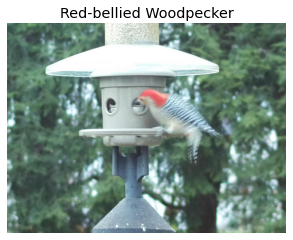

('Black-capped Chickadee', tensor(0), tensor([9.3458e-01, 4.7029e-04, 7.5255e-05, 4.8062e-04, 4.9338e-06, 5.0334e-05, 2.6327e-03, 2.2054e-06, 7.3307e-05, 3.7266e-02, 1.8955e-05, 3.7602e-06, 3.2551e-05, 2.4308e-02, 3.9424e-06]))


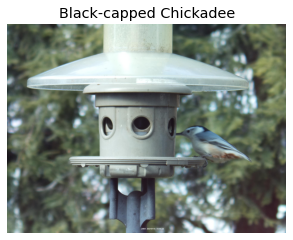

('Wren', tensor(14), tensor([1.3586e-04, 1.0744e-06, 1.5384e-06, 8.7721e-06, 5.2585e-05, 2.0843e-06, 1.2874e-04, 3.8267e-05, 2.2885e-05, 6.9343e-07, 6.3301e-07, 2.3601e-08, 1.9584e-03, 1.0910e-07, 9.9765e-01]))


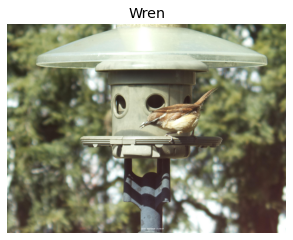

('Black-eyed Junco', tensor(1), tensor([6.0040e-05, 9.9958e-01, 1.8883e-05, 5.3558e-07, 2.8955e-08, 1.1466e-07, 2.8925e-06, 2.8006e-06, 4.4685e-07, 1.3499e-06, 2.3181e-06, 1.8069e-08, 9.8669e-07, 3.2981e-04, 1.6521e-08]))


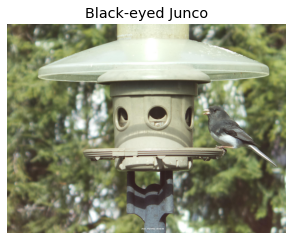

('Downy Woodpecker', tensor(5), tensor([6.9158e-02, 8.2379e-05, 5.1335e-05, 1.6656e-04, 2.3296e-05, 9.0389e-01, 2.5374e-05, 2.1122e-06, 7.8167e-05, 2.5284e-02, 4.3068e-05, 2.9304e-04, 1.7110e-05, 7.7593e-04, 1.1149e-04]))


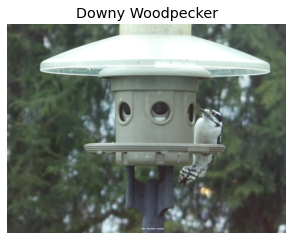

('Black-capped Chickadee', tensor(0), tensor([9.6242e-01, 5.5664e-05, 2.9243e-05, 2.7309e-04, 3.9389e-06, 2.8123e-05, 1.3255e-02, 9.5037e-06, 3.9246e-05, 9.6670e-05, 4.1890e-04, 2.5005e-07, 9.2886e-07, 2.3364e-02, 9.6847e-07]))


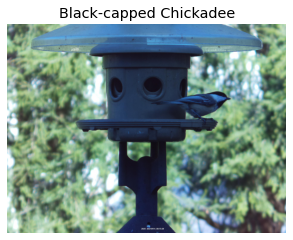

('Goldfinch', tensor(6), tensor([8.6004e-07, 7.7593e-09, 3.2448e-06, 2.9904e-06, 1.3432e-05, 2.2997e-08, 9.9995e-01, 1.1390e-07, 1.5071e-06, 3.4750e-06, 3.5695e-06, 2.7248e-07, 9.0530e-07, 1.6629e-05, 6.4112e-07]))


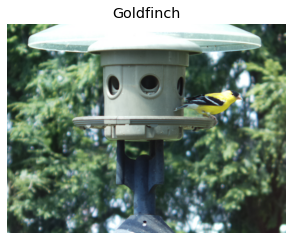

('Northern Flicker', tensor(8), tensor([3.4936e-06, 9.9573e-07, 5.4252e-05, 6.0250e-06, 1.3247e-06, 9.7093e-07, 3.5848e-07, 7.0848e-08, 9.9992e-01, 2.2853e-06, 5.1875e-07, 3.6524e-06, 5.3137e-07, 1.9987e-06, 1.1867e-07]))


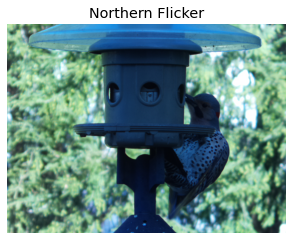

('Downy Woodpecker', tensor(5), tensor([2.0988e-10, 3.8460e-10, 6.2488e-09, 1.4161e-08, 1.7779e-10, 1.0000e+00, 6.4669e-11, 5.2057e-13, 5.7441e-10, 2.6798e-07, 2.0007e-09, 4.9265e-08, 8.7692e-11, 7.5188e-11, 2.2546e-10]))


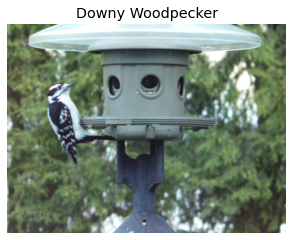

('Pine Siskin', tensor(10), tensor([1.4847e-07, 5.1525e-08, 2.0540e-06, 3.9180e-07, 2.8239e-08, 3.8191e-07, 8.4934e-07, 2.0629e-05, 8.5309e-07, 6.9231e-06, 9.9977e-01, 4.2338e-09, 1.9391e-04, 1.4114e-08, 8.3558e-08]))


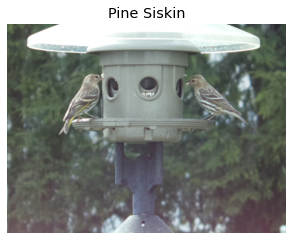

('Sparrow', tensor(12), tensor([9.5400e-07, 8.4329e-08, 5.8551e-04, 8.5054e-06, 1.4588e-04, 1.1111e-06, 3.1319e-07, 3.0929e-05, 9.4725e-06, 6.1145e-04, 1.9717e-04, 1.7576e-07, 9.9810e-01, 1.1910e-05, 2.9375e-04]))


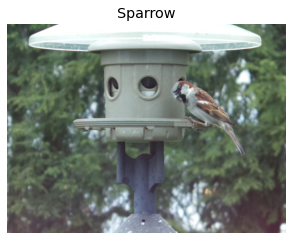

('House Finch', tensor(7), tensor([2.6699e-06, 6.7815e-07, 2.1581e-05, 6.1936e-06, 6.1353e-05, 8.7147e-09, 3.8661e-08, 9.9987e-01, 7.0347e-07, 1.3484e-07, 1.8888e-05, 1.0214e-07, 8.7869e-06, 5.4862e-06, 1.4652e-07]))


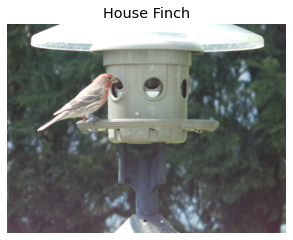

('Titmouse', tensor(13), tensor([1.7521e-03, 4.2135e-04, 5.2756e-03, 6.0255e-03, 5.6260e-04, 3.4966e-04, 9.3637e-05, 6.1625e-05, 1.3504e-04, 1.0360e-01, 8.0144e-04, 1.9409e-03, 3.7159e-05, 8.7877e-01, 1.7309e-04]))


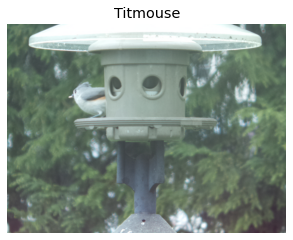

('Cardinal', tensor(4), tensor([7.0226e-10, 3.4064e-09, 3.4986e-05, 8.6896e-07, 9.9989e-01, 6.3346e-08, 3.4776e-09, 1.3251e-07, 1.2651e-06, 1.4257e-08, 1.1414e-07, 6.5111e-05, 9.6264e-08, 7.8018e-07, 2.4581e-06]))


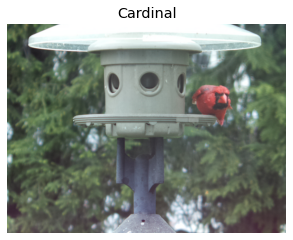

('Blackbird', tensor(2), tensor([1.0098e-05, 8.4185e-04, 9.6567e-01, 1.2403e-03, 1.5492e-03, 3.8582e-04, 2.9757e-05, 9.3461e-04, 2.4523e-04, 1.2411e-02, 5.9263e-04, 4.6825e-05, 1.9244e-04, 1.5748e-02, 9.9033e-05]))


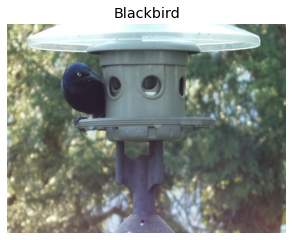

In [32]:
# Try some predictions for some images not in the training or validation data set
for p in images:
  file = str(image_path)+'/'+p
  im=PILImage.create(file)
  pred = learn.predict(file)
  print(pred)
  a = show_image(im)
  a.set_title(pred[0])
  plt.show()

We got only one wrong out of 15! I believe that this is because of the consistency between the training images and the inference images. They all are the same size and the camera was consistently placed a few feet away from the feeder. The feeder is also consistent in each image.

In [ ]:
import torch
import numpy as np

In [ ]:
# export model to TorchScript format
path_img = '/content/drive/MyDrive/Colab Notebooks/models/'
trace_input = torch.ones(1,3,299,299).cuda()

In [ ]:
jit_model = torch.jit.trace(learn.model.float(), trace_input)
model_file='resnet18_birds_jit.pth'
output_path = path_img+model_file

In [ ]:
output_path

'/content/drive/MyDrive/Colab Notebooks/models/resnet18_birds_jit.pth'

In [ ]:
dls.vocab

['Black-capped Chickadee', 'Black-eyed Junco', 'Blackbird', 'Blue Jay', 'Cardinal', 'Downy Woodpecker', 'Goldfinch', 'House Finch', 'Northern Flicker', 'Nuthatch', 'Pine Siskin', 'Red-bellied Woodpecker', 'Sparrow', 'Squirrel', 'Titmouse', 'Wren']

In [ ]:
torch.jit.save(jit_model, output_path)
# export classes text file
vocab_file=path_img+'vocab.npy'
tar_file=path_img+'model.tar.gz'
vocab = np.save(vocab_file, dls.vocab)

In [ ]:
tar_file

'/content/drive/MyDrive/Colab Notebooks/models/model.tar.gz'

In [ ]:
# create a tarfile with the exported model and classes text file
with tarfile.open(tar_file, 'w:gz') as f:
    f.add(path_img, arcname=model_file)
    f.add(path_img, arcname=vocab_file)